### **Std ID**: 190041138

### **Name**: Sidratul Tanzila Tasmi

In [2]:
from IPython.display import Audio
import librosa
import librosa.display
from scipy.io.wavfile import write
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [3]:
plt.rcParams["figure.figsize"] = (14,10)
plt.rcParams.update({'font.size': 14})

### **Playing an Audio File**

In [4]:
# choose a song of your liking (the more uncommon it is, the better), now play it using IPython.display's Audio Function
from google.colab import files
file=files.upload()


Saving music.mp3 to music.mp3


In [5]:
display(Audio("music.mp3", autoplay=True))

### **Reading an Audio File into an array**

##### **Sample Rate - The sampling rate refers to the number of samples of audio recorded every second. The most common sample rate for digital audio is 44100 Hertz; this means that the CT sound-wave is sampled 44100 times every second.**

<sup>Source: [A [Mathematical] Analysis of Sample Rates and Audio Quality](https://blogs.umass.edu/Techbytes/2018/04/20/a-mathematical-analysis-of-sample-rates-and-audio-quality/) by Noah Sheridan</sup>

In [6]:
# read your music here # sr is the sample_rate

audio_array,sr = librosa.load("music.mp3", sr=22050) # ignore user warning

In [7]:
audio_array.shape

(2705472,)

In [8]:
# clip the audio_array upto first 90000 samples
audio_array2 = audio_array
audio_array3=np.zeros(90000)
for i in range(90000):
  audio_array3[i]+=(audio_array2[i])


In [9]:
# print the shape of audio_array
audio_array3.shape

(90000,)

In [10]:
# print the sampling rate sr
sr

22050

In [11]:
# play the clipped/truncated audio_array using Audio() function
# Audio(audio_array, rate=sampling_rate)

Audio(audio_array3, rate=sr)

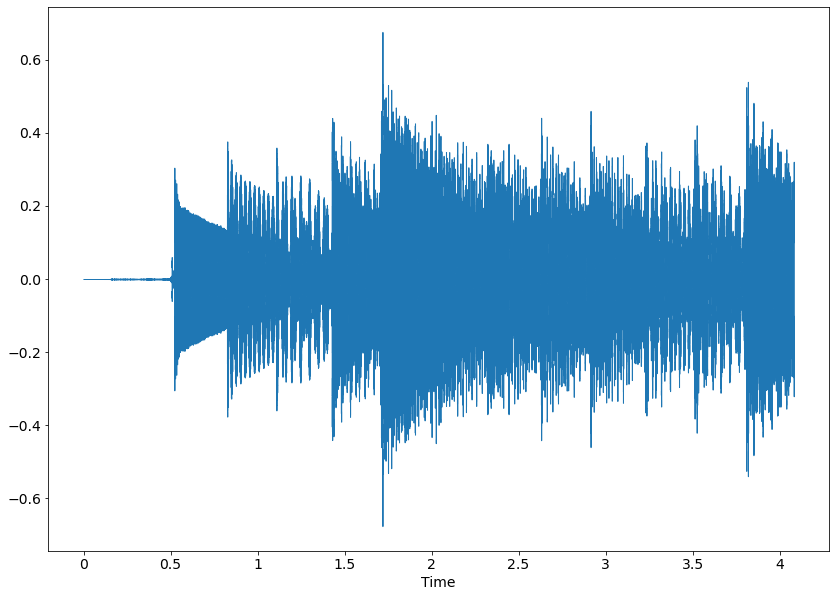

In [12]:
# plot the clipped/truncated audio_array using librosa.display.waveplot() function
import librosa.display
librosa.display.waveshow(audio_array3, sr=sr);

### **Audio Manipulation**

In [13]:
# In this part, you will implement the moving average filter as shown in the class

# make a function called moving_average( input_signal_I, neighborhood_size_N )
# it will output a signal with equal size of the input signal
# each output_signal sample will contain the average of that corresponding sample value of input signal and (N-1) samples before it.
# for the first N samples you will see that the neighborhood goes beyond the edges of input_signal, then consider those samples to be zero (just as shown in class)
# don't implement it using any fancy automated library function. Just go over the signal and do some arithmatic calculation.

def moving_average(audio, neighbor):
  output = []
  audio_cumsum = audio.cumsum()
  output.append(audio_cumsum[0])

  for i in range(1, len(audio)):
    idx = max(i-neighbor, 0)
    n = min(i+1, neighbor)
    output.append((audio[i] - audio_cumsum[idx])/n)
  return output

mov_avg_output = moving_average(audio_array3,1000)

In [14]:
# listen to the moving average output signal
Audio(mov_avg_output, rate=sr)

In [15]:
# now listen to the original signal again, can you hear any difference?
Audio(audio_array3, rate=sr)

**Explain what are the differences that you hear in between these two signals, does it match with the theory that was taught in the class?**


Write your answer in this text cell.

In [16]:
# now we will implement the moving_avg using convolution. We will use np.convolve
# here, np.ones(w)/w is the kernel of the low pass filter (moving avg. filter)
# passing 'same' in the function means, I want to keep the garbage values (as shown in the class) on the both sides. If I passed 'valid', then it would crop the two sides to discard the garbage values

def moving_average_np_conv(x, w):
  return np.convolve(x, np.ones(w), 'same')/w
   

mov_avg_conv_output = moving_average_np_conv(audio_array3,1000)  

Audio(mov_avg_conv_output, rate=sr)

# **Creating an Audio File**

In [17]:
# first, let's create an audio of about 2 seconds with sample_rate = 22500
sample_rate=22500
seconds=2
# use np.random.uniform to generate an array with (sample_rate*seconds) values. The values should be within -1 to 1, put it in the variable random_audio
random_audio=np.random.uniform(size=sample_rate*seconds)
# random_audio = ?
print(random_audio.shape)
# now, let's play that audio
Audio(random_audio, rate=22500)

(45000,)


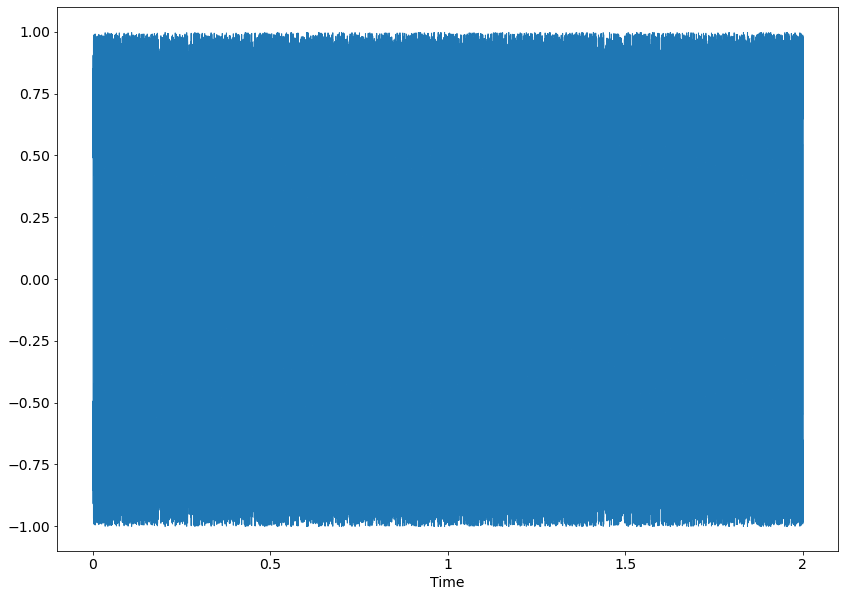

In [18]:
import librosa.display
# plot random_audio using librosa waveplot
librosa.display.waveshow(random_audio,sr=sample_rate)

### **Creating audio from General Wave Equations**

In this section, you will actually use the equations taught in the class to generate your own music. In the class, I showed you cosine waves, but sine waves can be used as well. For this task, we will be using sine.

**Wave Function: $f(t) = (A) \ sin(2\pi \ Ft): \text{where $A=$ Amplitude, $F=$frequency, $t$ = time}$**

<sup>Source: [How to Play Music Using Mathematics in Python](https://towardsdatascience.com/mathematics-of-music-in-python-b7d838c84f72) by Nishu Jain</sup>

In [20]:
samplerate = 44100

def get_wave(freq, duration=0.5):
    '''
    Function takes the "frequecy" and "time_duration" for a wave 
    as the input and returns a "numpy array" of values at all points 
    in time
    '''
    amplitude = 4096

    # create an array t with values from 0 to duration. as the number of samples will be about (samplerate*duration). The values of t represent time.
    number_of_samples=samplerate*duration
    t=np.linspace(0, duration, int(number_of_samples))
    # now calculate wave function f(t) as shown in the text cell above, for each value in the array t
    # in other words, each value in the array t will give you an f(t). then put all the values of f(t) for each t in an array called 'wave'
    wave= amplitude*np.sin(2*np.pi*freq*t)
    # this function can be written in two lines using numpy
    
    return wave


In [21]:
# now test your function get_wave()
# play it in low volume, some of the wave might be a little harsh to hear
# put these values in frequency [100, 500, 1500]
frequency = 1500 # change this frequency value and observe the effect
test_audio = get_wave(frequency, duration = 1.5)
Audio(test_audio, rate = samplerate)

**Explain what are the differences that you hear in between the audios for different frequency values**


Write your answer here.

In [19]:
# read the given excel file using pandas
file=files.upload()


Saving note_frequencies.xlsx to note_frequencies.xlsx


In [22]:
df = pd.read_excel('note_frequencies.xlsx')

<sup>Source Data: [Frequencies for equal-tempered scale](https://pages.mtu.edu/~suits/notefreqs.html) by  Bryan H. Suits</sup>

In [23]:
# this excel files contains the chords and their corresponding frequencies
df

,Note,Frequency (Hz),Wavelength (cm)
0,C0,16.35,2109.89
1,C#0,17.32,1991.47
2,D0,18.35,1879.69
3,D#0,19.45,1774.20
4,E0,20.60,1674.62
...,...,...,...
103,G8,6271.93,5.50
104,G#8,6644.88,5.19
105,A8,7040.00,4.90
106,A#8,7458.62,4.63


In [24]:
# So, If you know chords of a certain song, then you can find out the frequencies 
# from the frequencies, you can generate short audio signals using get_wave() function, 
#then merging/concatenating the audio signal for different chords, you can create the whole song


In [25]:
def get_piano_notes():
    '''
    Returns a dict object for all the piano 
    note's frequencies
    '''
    octave = df['Note'].to_list()
    freq = df['Frequency (Hz)'].to_list()
    
    note_freqs = {note:sound for note,sound in zip(octave,freq)}
    note_freqs[''] = 0.0
    
    return note_freqs
  
note_freqs = get_piano_notes()

In [26]:
def get_song_wave(music_notes):
    '''
    Function to concatenate all the waves (notes)
    '''
    note_freqs = get_piano_notes() 
    song = [get_wave(note_freqs[note], duration=0.4) for note in music_notes.split('-')]
    song = np.concatenate(song)
    return song

music_notes = 'G#3-A3-A#3-B3-C4-C#4-D4-D#4-E4-F4-F#4-G4-A#4-C#5-D#5-F#5-F#4-C#5-G#4-F#4-F4-F#4-F#3-F#4-A#4-C#5-D#5-F#5-F#4-C#5-G#4'
music = get_song_wave(music_notes)
music = music * (16300/np.max(music)) 

Audio(music, rate=samplerate)
# changing the 'duration', you can the speed of the music
# changing the music_notes, you can create audios for different songs
# this particular chords/song is from Avicii's Fade into the darkness

<sup>Help: [How to Play Music Using Mathematics in Python](https://towardsdatascience.com/mathematics-of-music-in-python-b7d838c84f72) by Nishu Jain</sup>

#### Save your music as my_music.wav

In [27]:
# save your music as a .wav file
# write('my_music.wav', samplerate, my_music.astype(np.int16))
#music_notes = '''F#4-G4-A#4-C#5-D#5-F#5-F#4-C#5-G#4-F#4-F4-F#4-F#3-F#4-A#4-C#5-D#5-F#5-F#4-C#5-G#4-F#4-F4-F#4-F#3-F#4-A#4-C#5-D#5-F#5-F#4-C#5-G#4'''
music_notes = '''C#5-G#4-F#4-F4-F#4-F#3-F#4-A#4-C#5-D#5-F#5-F#4-C#5-G#4'''
#music_notes = '''F4-C5-G4'''
my_music = get_song_wave(music_notes)
my_music = my_music * (16300/np.max(my_music)) 

In [28]:
# play the saved music
Audio(my_music, rate=samplerate)

## **DFT and Spectral Analysis**



Now you need to read the music you just created and do spectral analysis to find out the frequency composition.

In frequency composition, you should see peaks on the frequencies of the notes you took in the variable 'music_notes'.

To implement DFT, you can either use numpy or your own implementations. Get the DFT is Polar format. Now, plot and analyze the magnitude array to see where the peaks are.

Then, convert the DFT into analog signal format, where the y axis is the values and xaxis is the analog frequencies, which ranges from 0 Hz to (SamplingRate/2) Hz.

Write down the frequencies of the peaks and match them with corresponding notes from the excel sheet to figure out what notes were played in the music.

In [29]:
import math
def React2Polar(ReX,ImX):
  K = len(ReX)
  MagX, PhaseX = np.zeros(K), np.zeros(K)
  for k in range(K):
    MagX[k] = math.sqrt(ReX[k] * ReX[k] + ImX[k] * ImX[k])
    PhaseX[k] = math.atan(ImX[k]/ReX[k])
  
  
  return MagX,PhaseX

In [30]:
def myIDFT(ReX, ImX):
    ReX2 = np.array(ReX)
    ImX2 = np.array(ImX)
    n = len(ReX) * 2
    x = np.zeros(n)
    
    for k in range(n//2):
        ReX2[k] = ReX2[k]/(n//2)
        ImX2[k] = -ImX2[k]/(n//2)
    
    ReX2[0] = ReX2[0]/2
    ReX2[-1] = ReX2[-1]/2
    
    for k in range(n//2):
        for i in range(n-1):
            x[i] = x[i] + ReX2[k] * math.cos(2*math.pi*k*i/n)
            x[i] = x[i] + ImX2[k] * math.sin(2*math.pi*k*i/n)
    return x

In [31]:
spec_analysis = np.fft.rfft(my_music)


In [32]:
my_music

array([    0.        ,  1286.17931377,  2564.33802599, ...,
        9677.12551109, 10435.88704518, 11158.11785328])

In [33]:
# your code goes here

MagX, PhaseX=React2Polar(spec_analysis.real, spec_analysis.imag)


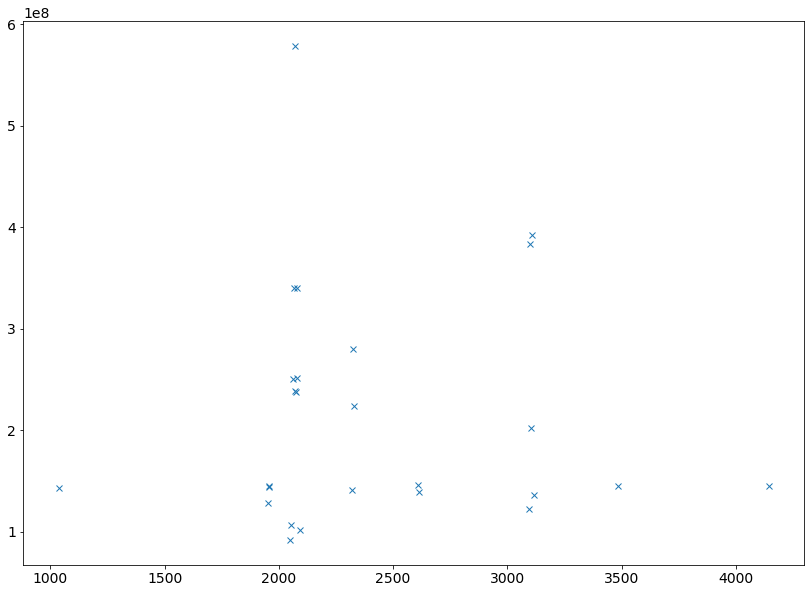

In [54]:
from scipy.signal import find_peaks
peaks, _ = find_peaks(MagX,height=90000000)
plt.plot(peaks, MagX[peaks], "x")

In [55]:
peaks.shape

(26,)

Now we reconstruct the signal

In [44]:
audio=myIDFT(MagX, PhaseX)

KeyboardInterrupt: ignored

Since it is very computationaly expensive, we can take a look at alternate approach which is FFT(faster version)

In [56]:
fft_x = np.fft.fft(my_music)

In [57]:
ifft_y = np.fft.ifft(fft_x)

Then we find the required changing the sampling rate from which ranges from 0 Hz to (SamplingRate/2) Hz.

In [58]:
for i in range(0, len(peaks)):
  frequencies = peaks[i] * (sample_rate / len(ifft_y))
  print(frequencies)
#frequencies

94.38775510204081
177.84256559766763
178.11588921282797
178.29810495626822
186.77113702623905
186.9533527696793
188.0466472303207
188.22886297376093
188.50218658892126
188.77551020408163
189.04883381924196
189.32215743440233
189.50437317784255
190.59766763848395
211.1880466472303
211.734693877551
212.3724489795918
237.79154518950435
238.0648688046647
281.8877551020408
282.5255102040816
282.8899416909621
283.1632653061224
283.80102040816325
317.6020408163265
377.55102040816325


In [59]:
for i in range(0, len(peaks)):
  frequencies = peaks[i] * (sample_rate*0.5 / len(MagX))
  print(frequencies)
#frequencies

94.38699071112156
177.8411253553178
178.11444675699096
178.29666102477304
186.76962447664013
186.95183874442222
188.04512435111474
188.22733861889682
188.50066002056997
188.7739814222431
189.04730282391623
189.32062422558937
189.50283849337146
190.59612410006397
211.1863363594399
211.7329791627862
212.37072910002348
237.78961945562475
238.0629408572979
281.88547225889005
282.52322219612734
282.8876507316915
283.1609721333646
283.79872207060197
317.59946874417926
377.5479628444862


In [61]:
for i in range(0, len(peaks)):
  frequencies = peaks[i] * (sample_rate / len(my_music))
  print(frequencies)
#frequencies

94.38775510204081
177.84256559766763
178.11588921282797
178.29810495626822
186.77113702623905
186.9533527696793
188.0466472303207
188.22886297376093
188.50218658892126
188.77551020408163
189.04883381924196
189.32215743440233
189.50437317784255
190.59766763848395
211.1880466472303
211.734693877551
212.3724489795918
237.79154518950435
238.0648688046647
281.8877551020408
282.5255102040816
282.8899416909621
283.1632653061224
283.80102040816325
317.6020408163265
377.55102040816325


In [ ]:
#music_notes = '''C#5-G#4-F#4-F4-F#4-F#3-F#4-A#4-C#5-D#5-F#5-F#4-C#5-G#4'''
#94- F#2, 177- F3, 186- F#3 211- G#3 and so on

For verification of our algorithm we can work with a smaller note

In [62]:
music_notes = '''F#4-C#5-G#4'''
#music_notes = '''F4-C5-G4'''
my_music = get_song_wave(music_notes)
my_music = my_music * (16300/np.max(my_music)) 

In [63]:
spec_analysis = np.fft.rfft(my_music)


In [65]:
# your code goes here

MagX, PhaseX=React2Polar(spec_analysis.real, spec_analysis.imag)


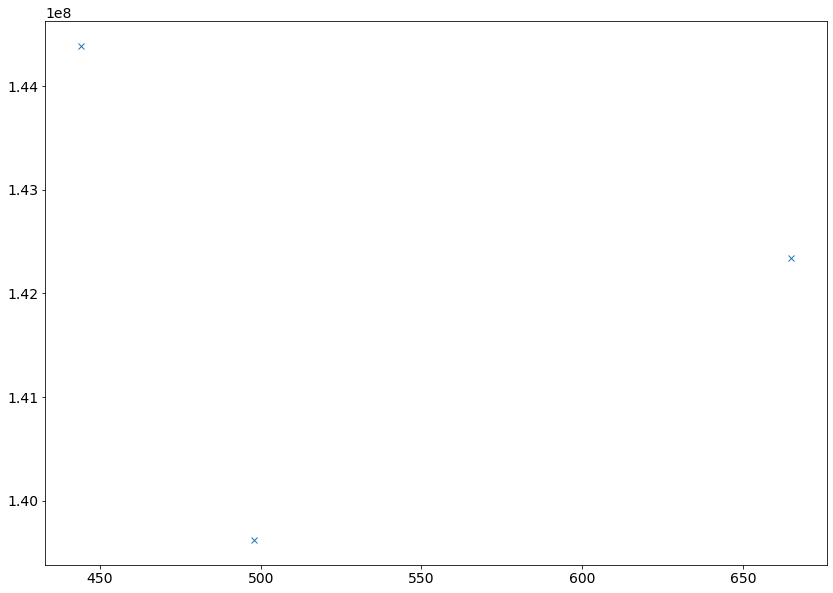

In [67]:
from scipy.signal import find_peaks
peaks, _ = find_peaks(MagX,height=80000000)
plt.plot(peaks, MagX[peaks], "x")

In [68]:
fft_x = np.fft.fft(my_music)

In [69]:
ifft_y = np.fft.ifft(fft_x)

In [72]:
for i in range(0, len(peaks)):
  frequencies = peaks[i] * (sample_rate/ len(my_music))
  print(frequencies)
#frequencies

188.77551020408163
211.734693877551
282.73809523809524


In [ ]:
#this frequencies correspond to F#4, G#4, C#5
#comparing the two signals

In [73]:
my_music = get_song_wave(music_notes)
my_music = my_music * (16300/np.max(my_music)) 

In [74]:
# play the saved music
#Original
Audio(my_music, rate=samplerate)

In [76]:
music_notes = '''F#4-C#5-G#4'''
#music_notes = '''F4-C5-G4''' #original one vs new one
my_music = get_song_wave(music_notes)
my_music = my_music * (16300/np.max(my_music)) 
Audio(my_music, rate=samplerate)

We can compare the frequencies with the frequencies we got in the excel file. Then we can see these frequencies are common. Thus our program is verified.

### **References and Additional Learning**

#### **Article**

- **[Analysis of Sample Rates and Audio Quality](https://blogs.umass.edu/Techbytes/2018/04/20/a-mathematical-analysis-of-sample-rates-and-audio-quality/) by Noah Sheridan**

- **[How to Play Music Using Mathematics in Python](https://towardsdatascience.com/mathematics-of-music-in-python-b7d838c84f72) by Nishu Jain</sup>**

#### **Frequency Data**

- **[Frequencies for equal-tempered scale](https://pages.mtu.edu/~suits/notefreqs.html) by  Bryan H. Suits**

#### **Video**

- **[Mathematics of Music](https://www.youtube.com/channel/UC5G6pckR64hW9GOgo_R7bpg/about) by Nishu Jain** 

#### **Websites**

- **[Jupyter Audio Basics from Notes on Music Information Retrieval](https://musicinformationretrieval.com/ipython_audio.html)**

- **[librosa documentation](https://librosa.org/doc/latest/index.html)**

- **[Module display for IPython](https://ipython.org/ipython-doc/3/api/generated/IPython.display.html)**

#### **Connect**

- **Feel free to connect with Adrian on [YouTube](https://www.youtube.com/channel/UCPuDxI3xb_ryUUMfkm0jsRA), [LinkedIn](https://www.linkedin.com/in/adrian-dolinay-frm-96a289106/), [Twitter](https://twitter.com/DolinayG) and [GitHub](https://github.com/ad17171717). Happy coding!**